### In this notebook we are training an object detection model to detect trash objects in images. We will be using a pretrained [Faster R-CNN model with ResNet-50 backbone](https://pytorch.org/vision/stable/models/generated/torchvision.models.detection.fasterrcnn_resnet50_fpn.html#torchvision.models.detection.fasterrcnn_resnet50_fpn). We will be using data from [TACO dataset](http://tacodataset.org/) that has over a thousand images of trash objects.

### Deployed model link: https://huggingface.co/spaces/purplelord2003/Trash_Object_Detector

## Getting our data
Our data has 1500 images to be split in a 70/20/10 ratio for train/valid/test images.

We will make a training and evaluation loop afterwards with the training images for training and validation images for evaluation while keeping the testing images to gauge the accuracy of the finalised model.

I have previously uploaded all the data into my Google Drive so we simply need to download it from my drive. While the data folder has various helpful functions, we will only be using the function to split the dataset.

In [ ]:
!gdown 1r6SIgpw2WGRHTLPVmcP1ZbgrBI2HcObL

Downloading...
From (original): https://drive.google.com/uc?id=1r6SIgpw2WGRHTLPVmcP1ZbgrBI2HcObL
From (redirected): https://drive.google.com/uc?id=1r6SIgpw2WGRHTLPVmcP1ZbgrBI2HcObL&confirm=t&uuid=7a145234-4ede-4aa6-b382-cb8cb3b6d020
To: /content/TACO.zip
100% 2.76G/2.76G [00:14<00:00, 190MB/s]


In [ ]:
from zipfile import ZipFile

with ZipFile("TACO.zip", "r") as zip_ref:
  zip_ref.extractall()

In [ ]:
!rm TACO.zip

In [ ]:
# Split into 70/20/10 ratio
import random
random.seed(42)
!python TACO/detector/split_dataset.py --dataset_dir=TACO/data/ --test_percentage=10 --val_percentage=20 --nr_trials=1

In [ ]:
## Set device agnostic code
import torch

# Set device
device = "cuda" if torch.cuda.is_available() else "cpu"

device

'cuda'

In [ ]:
!pip install pycocotools
from pycocotools.coco import COCO # helpful tool for coco formatted data

In [ ]:
coco = COCO("TACO/data/annotations.json") # lets take a look inside the full dataset

loading annotations into memory...
Done (t=0.16s)
creating index...
index created!


In [ ]:
coco.cats

{0: {'supercategory': 'Aluminium foil', 'id': 0, 'name': 'Aluminium foil'},
 1: {'supercategory': 'Battery', 'id': 1, 'name': 'Battery'},
 2: {'supercategory': 'Blister pack',
  'id': 2,
  'name': 'Aluminium blister pack'},
 3: {'supercategory': 'Blister pack', 'id': 3, 'name': 'Carded blister pack'},
 4: {'supercategory': 'Bottle', 'id': 4, 'name': 'Other plastic bottle'},
 5: {'supercategory': 'Bottle', 'id': 5, 'name': 'Clear plastic bottle'},
 6: {'supercategory': 'Bottle', 'id': 6, 'name': 'Glass bottle'},
 7: {'supercategory': 'Bottle cap', 'id': 7, 'name': 'Plastic bottle cap'},
 8: {'supercategory': 'Bottle cap', 'id': 8, 'name': 'Metal bottle cap'},
 9: {'supercategory': 'Broken glass', 'id': 9, 'name': 'Broken glass'},
 10: {'supercategory': 'Can', 'id': 10, 'name': 'Food Can'},
 11: {'supercategory': 'Can', 'id': 11, 'name': 'Aerosol'},
 12: {'supercategory': 'Can', 'id': 12, 'name': 'Drink can'},
 13: {'supercategory': 'Carton', 'id': 13, 'name': 'Toilet tube'},
 14: {'supe

In [ ]:
# Create classes list
classes = [coco.cats[i]['name'] for i in range(len(coco.cats))]

In [ ]:
classes

['Aluminium foil',
 'Battery',
 'Aluminium blister pack',
 'Carded blister pack',
 'Other plastic bottle',
 'Clear plastic bottle',
 'Glass bottle',
 'Plastic bottle cap',
 'Metal bottle cap',
 'Broken glass',
 'Food Can',
 'Aerosol',
 'Drink can',
 'Toilet tube',
 'Other carton',
 'Egg carton',
 'Drink carton',
 'Corrugated carton',
 'Meal carton',
 'Pizza box',
 'Paper cup',
 'Disposable plastic cup',
 'Foam cup',
 'Glass cup',
 'Other plastic cup',
 'Food waste',
 'Glass jar',
 'Plastic lid',
 'Metal lid',
 'Other plastic',
 'Magazine paper',
 'Tissues',
 'Wrapping paper',
 'Normal paper',
 'Paper bag',
 'Plastified paper bag',
 'Plastic film',
 'Six pack rings',
 'Garbage bag',
 'Other plastic wrapper',
 'Single-use carrier bag',
 'Polypropylene bag',
 'Crisp packet',
 'Spread tub',
 'Tupperware',
 'Disposable food container',
 'Foam food container',
 'Other plastic container',
 'Plastic glooves',
 'Plastic utensils',
 'Pop tab',
 'Rope & strings',
 'Scrap metal',
 'Shoe',
 'Squeez

In [ ]:
coco.loadImgs(0) # details for image with image_id 0

[{'id': 0,
  'width': 1537,
  'height': 2049,
  'file_name': 'batch_1/000006.jpg',
  'license': None,
  'flickr_url': 'https://farm66.staticflickr.com/65535/33978196618_e30a59e0a8_o.png',
  'coco_url': None,
  'date_captured': None,
  'flickr_640_url': 'https://farm66.staticflickr.com/65535/33978196618_632623b4fc_z.jpg'}]

In [ ]:
coco.loadAnns(1) # 1 annotation for image with image_id 0, we can ignore the segmentation data and focus on bbox (bounding box)

[{'id': 1,
  'image_id': 0,
  'category_id': 6,
  'segmentation': [[561.0,
    1238.0,
    568.0,
    1201.0,
    567.0,
    1175.0,
    549.0,
    1127.0,
    538.0,
    1089.0,
    519.0,
    1043.0,
    517.0,
    1005.0,
    523.0,
    964.0,
    529.0,
    945.0,
    520.0,
    896.0,
    525.0,
    862.0,
    536.0,
    821.0,
    554.0,
    769.0,
    577.0,
    727.0,
    595.0,
    678.0,
    596.0,
    585.0,
    588.0,
    346.0,
    581.0,
    328.0,
    569.0,
    306.0,
    570.0,
    276.0,
    576.0,
    224.0,
    560.0,
    205.0,
    564.0,
    170.0,
    578.0,
    154.0,
    608.0,
    136.0,
    649.0,
    127.0,
    688.0,
    127.0,
    726.0,
    129.0,
    759.0,
    141.0,
    784.0,
    153.0,
    792.0,
    177.0,
    788.0,
    193.0,
    782.0,
    209.0,
    792.0,
    238.0,
    802.0,
    271.0,
    802.0,
    294.0,
    791.0,
    319.0,
    789.0,
    360.0,
    794.0,
    395.0,
    810.0,
    529.0,
    819.0,
    609.0,
    841.0,
    675.0,
    8

In [ ]:
coco.loadAnns(2) # another annotation for image with image_id 0

[{'id': 2,
  'image_id': 1,
  'category_id': 18,
  'segmentation': [[928.0,
    1876.0,
    938.0,
    1856.0,
    968.0,
    1826.0,
    990.0,
    1808.0,
    998.0,
    1790.0,
    1069.0,
    1727.0,
    1096.0,
    1702.0,
    1159.0,
    1644.0,
    1212.0,
    1588.0,
    1258.0,
    1540.0,
    1314.0,
    1482.0,
    1357.0,
    1444.0,
    1392.0,
    1416.0,
    1409.0,
    1393.0,
    1430.0,
    1369.0,
    1415.0,
    1347.0,
    1130.0,
    1087.0,
    780.0,
    763.0,
    528.0,
    533.0,
    479.0,
    486.0,
    466.0,
    466.0,
    448.0,
    457.0,
    427.0,
    468.0,
    387.0,
    502.0,
    321.0,
    554.0,
    244.0,
    608.0,
    118.0,
    693.0,
    37.0,
    750.0,
    3.0,
    780.0,
    1.0,
    995.0,
    28.0,
    1032.0,
    104.0,
    1119.0,
    403.0,
    1471.0,
    666.0,
    1805.0,
    763.0,
    1954.0,
    782.0,
    1945.0,
    796.0,
    1970.0,
    803.0,
    1976.0,
    818.0,
    1976.0,
    836.0,
    1956.0,
    852.0,
    1954.0,

In [ ]:
coco.getAnnIds(0) # all annotation ids for image with image_id 0

[1]

In [ ]:
coco.loadAnns((4, 5)) # loading some annotations using the annotation ids

[{'id': 4,
  'image_id': 2,
  'category_id': 5,
  'segmentation': [[670.0,
    993.0,
    679.0,
    998.0,
    684.0,
    1001.0,
    688.0,
    1005.0,
    690.0,
    1009.0,
    697.0,
    1010.0,
    707.0,
    1011.0,
    743.0,
    1013.0,
    754.0,
    1012.0,
    782.0,
    1016.0,
    801.0,
    1021.0,
    815.0,
    1027.0,
    843.0,
    1047.0,
    912.0,
    1091.0,
    924.0,
    1101.0,
    948.0,
    1118.0,
    1026.0,
    1166.0,
    1094.0,
    1208.0,
    1111.0,
    1219.0,
    1124.0,
    1230.0,
    1131.0,
    1242.0,
    1132.0,
    1253.0,
    1129.0,
    1264.0,
    1124.0,
    1275.0,
    1118.0,
    1285.0,
    1108.0,
    1298.0,
    1100.0,
    1313.0,
    1092.0,
    1323.0,
    1088.0,
    1331.0,
    1081.0,
    1342.0,
    1074.0,
    1350.0,
    1066.0,
    1358.0,
    1054.0,
    1361.0,
    1040.0,
    1358.0,
    1025.0,
    1349.0,
    1018.0,
    1347.0,
    1013.0,
    1344.0,
    1008.0,
    1340.0,
    1006.0,
    1336.0,
    998.0,
    133

## Creating our custom datasets in PyTorch

In [ ]:
import torchvision
from torchvision import datasets
from PIL import Image
import os
import os.path
from torchvision.ops import box_convert
from torch.utils.data import Dataset
from torchvision import tv_tensors

In [ ]:
class TACODataset(Dataset):
  def __init__(self, root: str, annFile:str, image_transforms=None, all_transforms=None):
    super().__init__()
    self.root = root
    self.image_transforms = image_transforms
    self.all_transforms = all_transforms
    self.coco = COCO(annFile)
    self.ids = list(sorted(self.coco.imgs.keys()))

  def _load_image(self, id:int) -> Image.Image: # id refers to the image id
    path = self.coco.loadImgs(id)[0]["file_name"]
    return Image.open(os.path.join(self.root, path)).convert("RGB")

  def _load_target(self, id):
    return self.coco.loadAnns(self.coco.getAnnIds(id)) # checks for annotations for the image_id and loads those annotations

  def __getitem__(self, index: int):
    id = self.ids[index]
    image = self._load_image(id)
    target = self._load_target(id)

    target_dict = {}
    boxes = []
    for dictionary in target:
      box_tensor = torch.tensor(dictionary["bbox"], dtype=torch.float32)
      converted_box_tensor = box_convert(box_tensor, in_fmt="xywh", out_fmt="xyxy")
      boxes.append(converted_box_tensor)

    boxes_tensor = torch.stack(boxes)
    target_dict["boxes"] = boxes_tensor
    target_dict["labels"] = torch.tensor([d["category_id"] for d in target], dtype=torch.int64)

    if self.all_transforms is not None:
      target_dict["boxes"] = tv_tensors.BoundingBoxes(boxes_tensor, format="XYXY", canvas_size=(image.size[1], image.size[0])) # PIL size tuple is (width, height) but we want (height, width)
      image, target_dict = self.all_transforms(image, target_dict)


    if self.image_transforms is not None:
      image = self.image_transforms(image)

    return image, target_dict

  def __len__(self) -> int:
    return len(self.ids)

In [ ]:
# Create transform to convert images into tensors from range 0 to 1
transform = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor()
])

In [ ]:
# Create train, validation and test datasets
train_dataset = TACODataset(root="TACO/data/", annFile="TACO/data/annotations_0_train.json", image_transforms=transform)
valid_dataset = TACODataset(root="TACO/data/", annFile="TACO/data/annotations_0_val.json", image_transforms=transform)
test_dataset = TACODataset(root="TACO/data/", annFile="TACO/data/annotations_0_test.json", image_transforms=transform)

loading annotations into memory...
Done (t=0.04s)
creating index...
index created!
loading annotations into memory...
Done (t=0.02s)
creating index...
index created!
loading annotations into memory...
Done (t=0.15s)
creating index...
index created!


In [ ]:
len(train_dataset), len(valid_dataset), len(test_dataset) # total of 1500 images

(1050, 300, 150)

## Testing out our dataset


In [ ]:
train_dataset.ids[:10] # the image ids are randomly allocated across the 3 datasets

[0, 1, 2, 5, 6, 8, 9, 10, 11, 12]

In [ ]:
idx = train_dataset.ids[0]

In [ ]:
train_dataset._load_target(idx)

[{'id': 1,
  'image_id': 0,
  'category_id': 6,
  'segmentation': [[561.0,
    1238.0,
    568.0,
    1201.0,
    567.0,
    1175.0,
    549.0,
    1127.0,
    538.0,
    1089.0,
    519.0,
    1043.0,
    517.0,
    1005.0,
    523.0,
    964.0,
    529.0,
    945.0,
    520.0,
    896.0,
    525.0,
    862.0,
    536.0,
    821.0,
    554.0,
    769.0,
    577.0,
    727.0,
    595.0,
    678.0,
    596.0,
    585.0,
    588.0,
    346.0,
    581.0,
    328.0,
    569.0,
    306.0,
    570.0,
    276.0,
    576.0,
    224.0,
    560.0,
    205.0,
    564.0,
    170.0,
    578.0,
    154.0,
    608.0,
    136.0,
    649.0,
    127.0,
    688.0,
    127.0,
    726.0,
    129.0,
    759.0,
    141.0,
    784.0,
    153.0,
    792.0,
    177.0,
    788.0,
    193.0,
    782.0,
    209.0,
    792.0,
    238.0,
    802.0,
    271.0,
    802.0,
    294.0,
    791.0,
    319.0,
    789.0,
    360.0,
    794.0,
    395.0,
    810.0,
    529.0,
    819.0,
    609.0,
    841.0,
    675.0,
    8

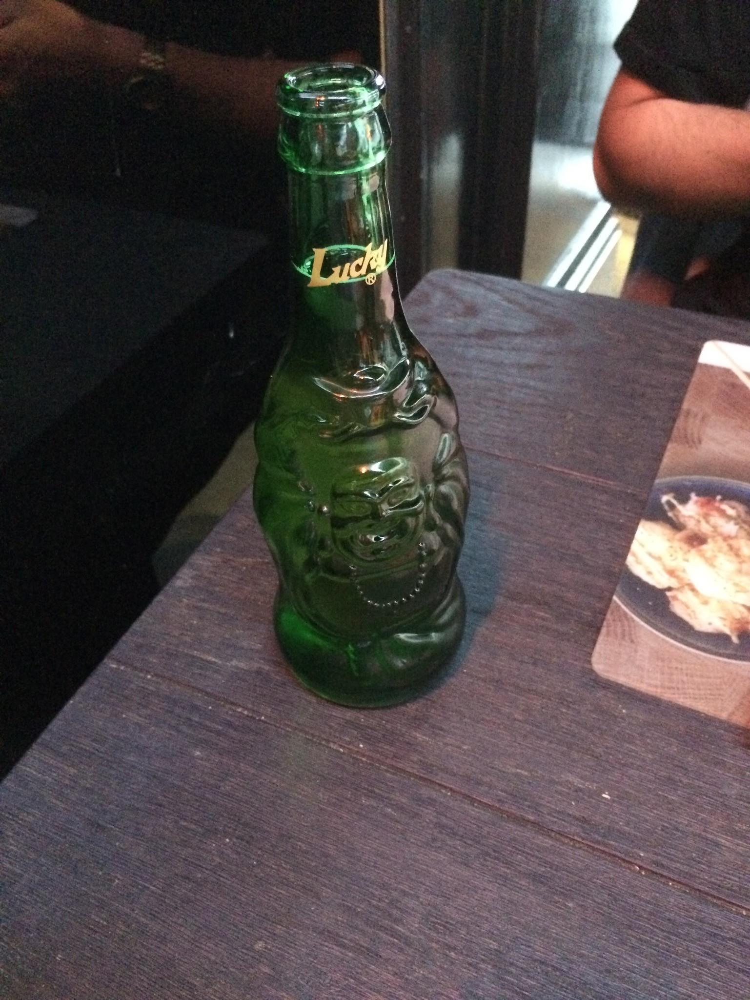

In [ ]:
train_dataset._load_image(idx)

In [ ]:
image, target = train_dataset.__getitem__(idx)

In [ ]:
image.shape # converted to colour_channels, height, width

torch.Size([3, 2049, 1537])

In [ ]:
target

{'boxes': tensor([[ 517.,  127.,  964., 1449.]]), 'labels': tensor([6])}

In [ ]:
train_dataset[0]

(tensor([[[0.2314, 0.2157, 0.2235,  ..., 0.0824, 0.0745, 0.0824],
          [0.2275, 0.2039, 0.2000,  ..., 0.0941, 0.0824, 0.0941],
          [0.3020, 0.2706, 0.2549,  ..., 0.1059, 0.0941, 0.1098],
          ...,
          [0.3216, 0.3255, 0.3176,  ..., 0.3882, 0.3804, 0.4000],
          [0.3176, 0.3176, 0.3098,  ..., 0.4392, 0.4157, 0.4471],
          [0.3725, 0.3490, 0.2745,  ..., 0.4588, 0.5137, 0.5333]],
 
         [[0.1020, 0.0863, 0.0941,  ..., 0.0510, 0.0510, 0.0706],
          [0.0980, 0.0745, 0.0706,  ..., 0.0627, 0.0588, 0.0824],
          [0.1725, 0.1412, 0.1255,  ..., 0.0824, 0.0706, 0.0980],
          ...,
          [0.2471, 0.2510, 0.2431,  ..., 0.3490, 0.3412, 0.3725],
          [0.2549, 0.2549, 0.2471,  ..., 0.4000, 0.3804, 0.4196],
          [0.3176, 0.2941, 0.2196,  ..., 0.4235, 0.4784, 0.4980]],
 
         [[0.1373, 0.1216, 0.1216,  ..., 0.0941, 0.0902, 0.1059],
          [0.1333, 0.1098, 0.0980,  ..., 0.1059, 0.0980, 0.1176],
          [0.2000, 0.1686, 0.1529,  ...,

In [ ]:
train_dataset[0][1]['labels']

tensor([6])

In [ ]:
classes[18], classes[14] # check the labels

('Meal carton', 'Other carton')

In [ ]:
# Get a font for our labels to be written in
!wget https://ttfonts.net/sfonts/1/16020_FUTURAM.ttf

--2024-02-05 07:15:52--  https://ttfonts.net/sfonts/1/16020_FUTURAM.ttf
Resolving ttfonts.net (ttfonts.net)... 31.207.45.27
Connecting to ttfonts.net (ttfonts.net)|31.207.45.27|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 38764 (38K) [application/octet-stream]
Saving to: ‘16020_FUTURAM.ttf’

16020_FUTURAM.ttf   100%[===================>]  37.86K  --.-KB/s    in 0.04s   

2024-02-05 07:15:53 (954 KB/s) - ‘16020_FUTURAM.ttf’ saved [38764/38764]



<ipython-input-72-a13897877961>:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_int = torch.tensor(sample[0] * 255, dtype=torch.uint8) # convert from image of tensor between 0 to 1 back to 0 to 255


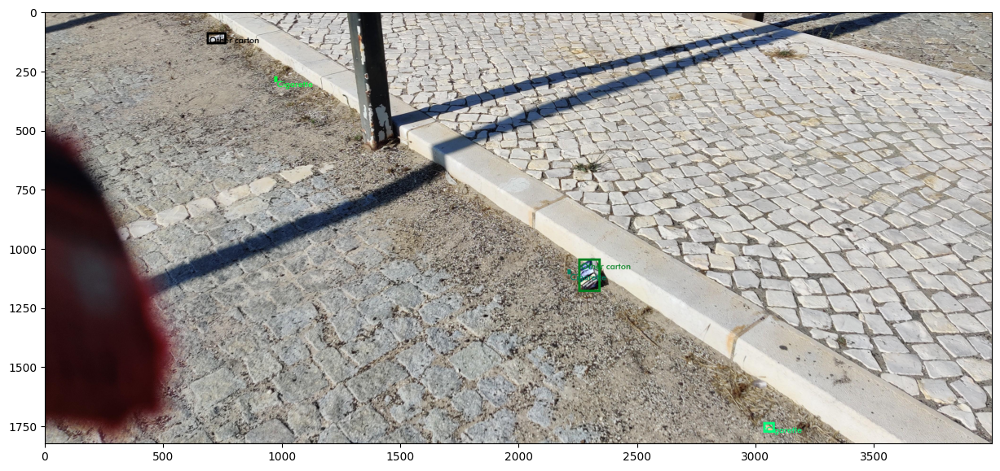

In [ ]:
# Try to view a sample (accuracy of the bounding boxes depends on the accuracy of the original TACO dataset)
import matplotlib.pyplot as plt
from torchvision.utils import draw_bounding_boxes

plt.figure(figsize=(15, 15))
sample = train_dataset[100]
img_int = torch.tensor(sample[0] * 255, dtype=torch.uint8) # convert from image of tensor between 0 to 1 back to 0 to 255
img_height = img_int.shape[1]
plt.imshow(draw_bounding_boxes(
    img_int, sample[1]['boxes'], [(classes[i]) for i in sample[1]['labels']], width=10, font="16020_FUTURAM.ttf", font_size=int(0.02 * img_height)
).permute(1, 2, 0))

## Importing pretrained model

In [ ]:
from torchvision import models
model_weights = models.detection.FasterRCNN_ResNet50_FPN_V2_Weights.DEFAULT
model = models.detection.fasterrcnn_resnet50_fpn_v2(weights=model_weights)

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_v2_coco-dd69338a.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_v2_coco-dd69338a.pth
100%|██████████| 167M/167M [00:00<00:00, 188MB/s]


In [ ]:
!pip install torchinfo
import torchinfo

In [ ]:
from torchinfo import summary
# Print model summary
summary(model,
        input_size=(1, 3, 416, 416), # Batch_size, C, H, W (our images they will be resized within the model structure)
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"])

Layer (type (var_name))                            Input Shape          Output Shape         Param #              Trainable
FasterRCNN (FasterRCNN)                            [1, 3, 416, 416]     [0, 4]               --                   Partial
├─GeneralizedRCNNTransform (transform)             [1, 3, 416, 416]     [1, 3, 800, 800]     --                   --
├─BackboneWithFPN (backbone)                       [1, 3, 800, 800]     [1, 256, 13, 13]     --                   Partial
│    └─IntermediateLayerGetter (body)              [1, 3, 800, 800]     [1, 2048, 25, 25]    --                   Partial
│    │    └─Conv2d (conv1)                         [1, 3, 800, 800]     [1, 64, 400, 400]    (9,408)              False
│    │    └─BatchNorm2d (bn1)                      [1, 64, 400, 400]    [1, 64, 400, 400]    (128)                False
│    │    └─ReLU (relu)                            [1, 64, 400, 400]    [1, 64, 400, 400]    --                   --
│    │    └─MaxPool2d (maxpool)     

In [ ]:
len(classes)

60

Need to change from 91 classes (model was previously trained on 91 classes including background) to 20 classes (including background) in our case.

In [ ]:
model.roi_heads.box_predictor.cls_score.in_features

1024

In [ ]:
from torch import nn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

# Change the FastRCNNPredictor to suit our problem
num_classes = 61 # 60 classes + 1 for background
in_features = 1024
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

In [ ]:
## View our new model summary
summary(model,
        input_size=(1, 3, 416, 416), # Batch_size, C, H, W (our images are all 416 x 416 though they will be reformatted within the model structure)
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"])

Layer (type (var_name))                            Input Shape          Output Shape         Param #              Trainable
FasterRCNN (FasterRCNN)                            [1, 3, 416, 416]     [0, 4]               --                   Partial
├─GeneralizedRCNNTransform (transform)             [1, 3, 416, 416]     [1, 3, 800, 800]     --                   --
├─BackboneWithFPN (backbone)                       [1, 3, 800, 800]     [1, 256, 13, 13]     --                   Partial
│    └─IntermediateLayerGetter (body)              [1, 3, 800, 800]     [1, 2048, 25, 25]    --                   Partial
│    │    └─Conv2d (conv1)                         [1, 3, 800, 800]     [1, 64, 400, 400]    (9,408)              False
│    │    └─BatchNorm2d (bn1)                      [1, 64, 400, 400]    [1, 64, 400, 400]    (128)                False
│    │    └─ReLU (relu)                            [1, 64, 400, 400]    [1, 64, 400, 400]    --                   --
│    │    └─MaxPool2d (maxpool)     

In [ ]:
model.to(device)
torch.compile(model)

OptimizedModule(
  (_orig_mod): FasterRCNN(
    (transform): GeneralizedRCNNTransform(
        Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        Resize(min_size=(800,), max_size=1333, mode='bilinear')
    )
    (backbone): BackboneWithFPN(
      (body): IntermediateLayerGetter(
        (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
        (layer1): Sequential(
          (0): Bottleneck(
            (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (bn2): BatchNorm2d(64, eps=1e-

## Create custom function and dataloaders
Need to create custom function as the number of bounding boxes vary across images

In [ ]:
def collate_fn(batch):
    return tuple(zip(*batch))

In [ ]:
from torch.utils.data import DataLoader
train_dataloader = DataLoader(train_dataset, batch_size=4, shuffle=True, num_workers=0, collate_fn=collate_fn)
valid_dataloader = DataLoader(valid_dataset, batch_size=4, shuffle=False, num_workers=0, collate_fn=collate_fn)

In [ ]:
len(train_dataloader), len(valid_dataloader)

(263, 75)

In [ ]:
images, targets = next(iter(train_dataloader))

In [ ]:
images[:2]

(tensor([[[0.7647, 0.6667, 0.6431,  ..., 0.2863, 0.2706, 0.3882],
          [0.7451, 0.6471, 0.6196,  ..., 0.3059, 0.2824, 0.3686],
          [0.7608, 0.6627, 0.6392,  ..., 0.2667, 0.3216, 0.4588],
          ...,
          [0.1098, 0.1647, 0.1882,  ..., 0.0078, 0.0078, 0.0078],
          [0.2039, 0.2196, 0.2039,  ..., 0.0078, 0.0078, 0.0078],
          [0.1647, 0.2235, 0.2431,  ..., 0.0078, 0.0078, 0.0078]],
 
         [[0.6745, 0.5765, 0.5412,  ..., 0.1804, 0.1647, 0.2824],
          [0.6549, 0.5569, 0.5176,  ..., 0.2000, 0.1765, 0.2627],
          [0.6667, 0.5686, 0.5333,  ..., 0.1608, 0.2157, 0.3529],
          ...,
          [0.1412, 0.1961, 0.2196,  ..., 0.8627, 0.8627, 0.8627],
          [0.2353, 0.2510, 0.2353,  ..., 0.8627, 0.8627, 0.8627],
          [0.1961, 0.2549, 0.2745,  ..., 0.8627, 0.8627, 0.8627]],
 
         [[0.6196, 0.5216, 0.4902,  ..., 0.2078, 0.2000, 0.3176],
          [0.6000, 0.5020, 0.4667,  ..., 0.2275, 0.2118, 0.2980],
          [0.6196, 0.5216, 0.4902,  ...,

In [ ]:
targets[:2]

({'boxes': tensor([[ 359., 1030.,  910., 1365.],
          [1083., 2470., 1269., 2961.],
          [1586., 2447., 1702., 2641.]]),
  'labels': tensor([40,  5, 36])},
 {'boxes': tensor([[1050., 1654., 1460., 2007.]]), 'labels': tensor([12])})

Images will be fed as a list of image tensors, targets will be fed as a list of dictionaries

## Train model

In [ ]:
# Optimizer
optimizer = torch.optim.SGD(params = model.parameters(), lr=0.01, momentum=0.9, nesterov=True, weight_decay=1e-4)

In [ ]:
device

'cuda'

In [ ]:
torch.cuda.empty_cache()

In [ ]:
#!pip install torchmetrics
#import torchmetrics

In [ ]:
# Create directory for saving models
from pathlib import Path
MODEL_PATH = Path("models")
MODEL_PATH.mkdir(parents=True,
                 exist_ok=True)

In [ ]:
from tqdm.auto import tqdm
## Train the model
torch.manual_seed(42)
torch.cuda.manual_seed(42)

# Number of epochs:
epochs = 10

results = {
    "train_loss": [],
    "valid_loss": []
}

# Training and evaluation loop
for epoch in range(epochs):
  model.train()
  total_loss = 0

  for images, targets in tqdm(train_dataloader):
    images_list = list(image.to(device) for image in images)
    targets_list = [{k:v.to(device) for k,v in t.items()} for t in targets]
    loss_dict = model(images_list, targets_list)
    loss = sum(value for value in loss_dict.values()) # add up all the different loses (We seek to minimise this)
    total_loss += loss
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

  # Calculate average training loss per batch
  average_loss = round(total_loss.item() / 263, 4)
  results["train_loss"].append(average_loss)
  print(f"[INFO] Epochs: {epoch}, Average training loss per batch: {average_loss}")

  valid_total_loss = 0
  with torch.inference_mode():
    for images, targets in tqdm(valid_dataloader):
      images_list = list(image.to(device) for image in images)
      targets_list = [{k:v.to(device) for k,v in t.items()} for t in targets]
      valid_loss_dict = model(images_list, targets_list)
      valid_loss = sum(value for value in valid_loss_dict.values()) # add up all the different loses
      valid_total_loss += valid_loss

  # Calculate average validation loss per batch
  valid_average_loss = round(valid_total_loss.item() / 75, 4)
  results["valid_loss"].append(valid_average_loss)
  print(f"[INFO] Epochs: {epoch}, Average validation loss per batch: {valid_average_loss}")

  # Saving model after every epoch
  MODEL_NAME = f"fasterrcnn_resnet50_{epoch+1}_epochs_unaugmented.pth"
  MODEL_SAVE_PATH = MODEL_PATH / MODEL_NAME
  torch.save(obj=model.state_dict(),
            f=MODEL_SAVE_PATH)
  print(f"Model saved to {MODEL_SAVE_PATH}")

  # Early stopping
  if epoch >=1 and (results["valid_loss"][epoch] > min(results["valid_loss"])+ 0.05):
    print("Early stopping")
    break

  0%|          | 0/263 [00:00<?, ?it/s]

[INFO] Epochs: 0, Average training loss per batch: 0.7357


  0%|          | 0/75 [00:00<?, ?it/s]

[INFO] Epochs: 0, Average validation loss per batch: 0.6582
Model saved to models/fasterrcnn_resnet50_1_epochs_unaugmented.pth


  0%|          | 0/263 [00:00<?, ?it/s]

[INFO] Epochs: 1, Average training loss per batch: 0.5552


  0%|          | 0/75 [00:00<?, ?it/s]

[INFO] Epochs: 1, Average validation loss per batch: 0.5724
Model saved to models/fasterrcnn_resnet50_2_epochs_unaugmented.pth


  0%|          | 0/263 [00:00<?, ?it/s]

[INFO] Epochs: 2, Average training loss per batch: 0.4744


  0%|          | 0/75 [00:00<?, ?it/s]

[INFO] Epochs: 2, Average validation loss per batch: 0.5602
Model saved to models/fasterrcnn_resnet50_3_epochs_unaugmented.pth


  0%|          | 0/263 [00:00<?, ?it/s]

[INFO] Epochs: 3, Average training loss per batch: 0.4179


  0%|          | 0/75 [00:00<?, ?it/s]

[INFO] Epochs: 3, Average validation loss per batch: 0.5729
Model saved to models/fasterrcnn_resnet50_4_epochs_unaugmented.pth


  0%|          | 0/263 [00:00<?, ?it/s]

[INFO] Epochs: 4, Average training loss per batch: 0.3469


  0%|          | 0/75 [00:00<?, ?it/s]

[INFO] Epochs: 4, Average validation loss per batch: 0.5418
Model saved to models/fasterrcnn_resnet50_5_epochs_unaugmented.pth


  0%|          | 0/263 [00:00<?, ?it/s]

[INFO] Epochs: 5, Average training loss per batch: 0.3288


  0%|          | 0/75 [00:00<?, ?it/s]

[INFO] Epochs: 5, Average validation loss per batch: 0.5812
Model saved to models/fasterrcnn_resnet50_6_epochs_unaugmented.pth


  0%|          | 0/263 [00:00<?, ?it/s]

[INFO] Epochs: 6, Average training loss per batch: 0.3277


  0%|          | 0/75 [00:00<?, ?it/s]

[INFO] Epochs: 6, Average validation loss per batch: 0.5989
Model saved to models/fasterrcnn_resnet50_7_epochs_unaugmented.pth
Early stopping


In [ ]:
results

{'train_loss': [0.7357, 0.5552, 0.4744, 0.4179, 0.3469, 0.3288, 0.3277],
 'valid_loss': [0.6582, 0.5724, 0.5602, 0.5729, 0.5418, 0.5812, 0.5989]}

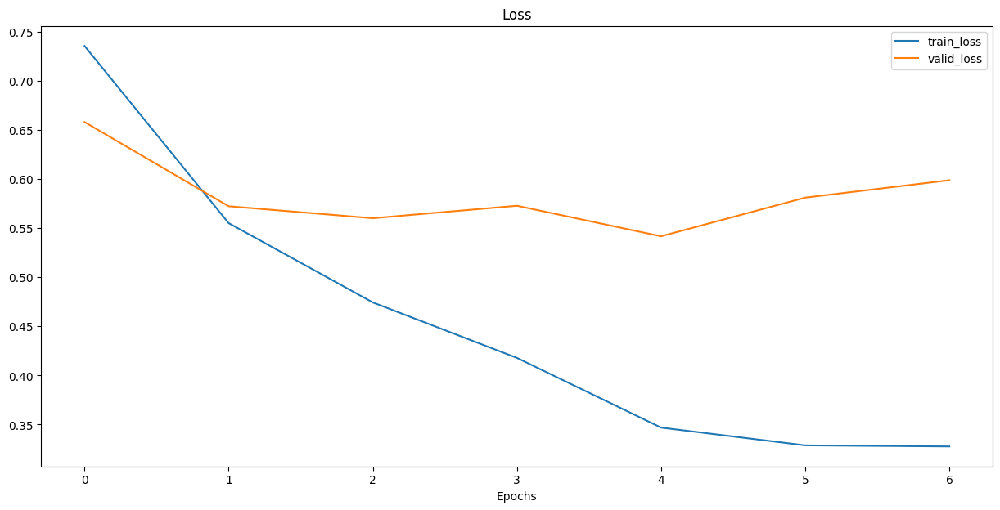

In [ ]:
# Plot the loss curves
train_loss = results["train_loss"]
valid_loss = results["valid_loss"]

epochs = len(train_loss)

# Set up plot
plt.figure(figsize=(15, 7))
plt.plot(range(epochs), train_loss, label='train_loss')
plt.plot(range(epochs), valid_loss, label='valid_loss')
plt.title('Loss')
plt.xlabel('Epochs')
plt.legend();

### The lowest validation loss was at epoch 4 (training for 5 epochs as epoch is zero indexed). However, there is a clear overfitting trend in the graph. We will try using greater data augmentation techniques to attempt solving the overfitting using the [transforms.v2 api](https://pytorch.org/blog/extending-torchvisions-transforms-to-object-detection-segmentation-and-video-tasks/).

In [ ]:
# Creating new data augmentation transforms
import torchvision.transforms.v2 as T
new_transforms = T.Compose([
    T.RandomPhotometricDistort(p=1),
    T.RandomHorizontalFlip(p=1),
    T.SanitizeBoundingBoxes(),
])

In [ ]:
# Create new train dataset
augmented_train_dataset = TACODataset(root="TACO/data/", annFile="TACO/data/annotations_0_train.json", image_transforms=transform, all_transforms=new_transforms)

loading annotations into memory...
Done (t=0.04s)
creating index...
index created!


## Before augmentation

<ipython-input-58-1625beaf24cb>:3: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_int = torch.tensor(sample[0] * 255, dtype=torch.uint8) # convert from image of tensor between 0 to 1 back to 0 to 255


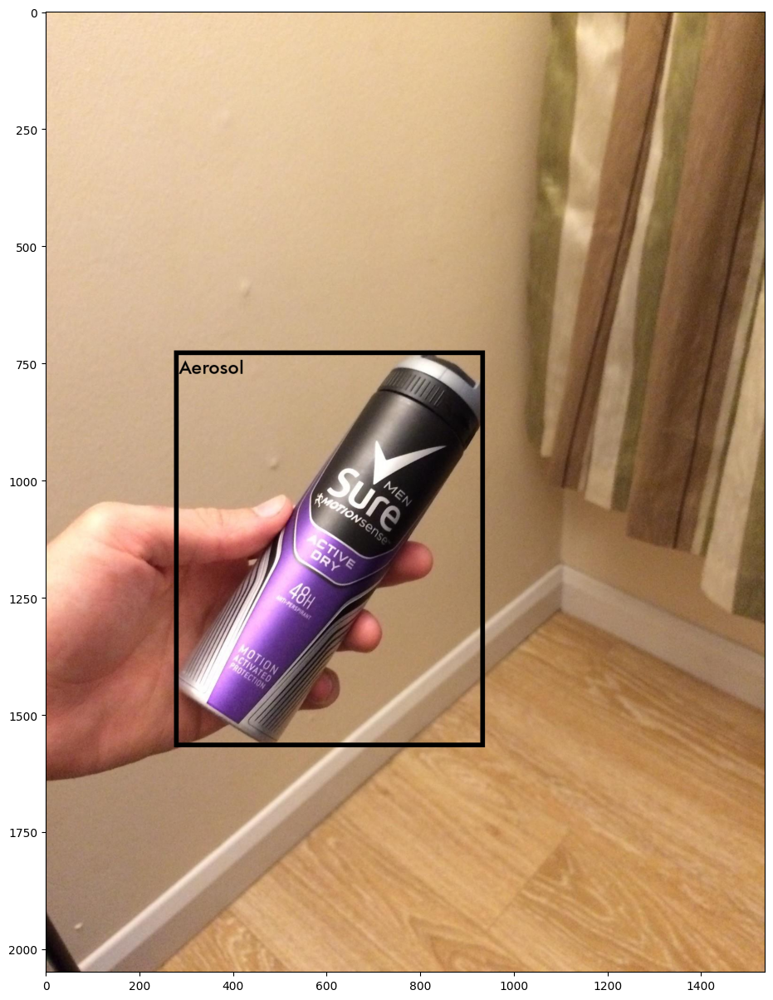

In [ ]:
plt.figure(figsize=(15, 15))
sample = train_dataset[18]
img_int = torch.tensor(sample[0] * 255, dtype=torch.uint8) # convert from image of tensor between 0 to 1 back to 0 to 255
img_height = img_int.shape[1]
plt.imshow(draw_bounding_boxes(
    img_int, sample[1]['boxes'], [(classes[i]) for i in sample[1]['labels']], width=10, font="16020_FUTURAM.ttf", font_size=int(0.02 * img_height)
).permute(1, 2, 0))

## After augmentation

<ipython-input-59-695402c107a6>:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_int = torch.tensor(sample[0] * 255, dtype=torch.uint8) # convert from image of tensor between 0 to 1 back to 0 to 255


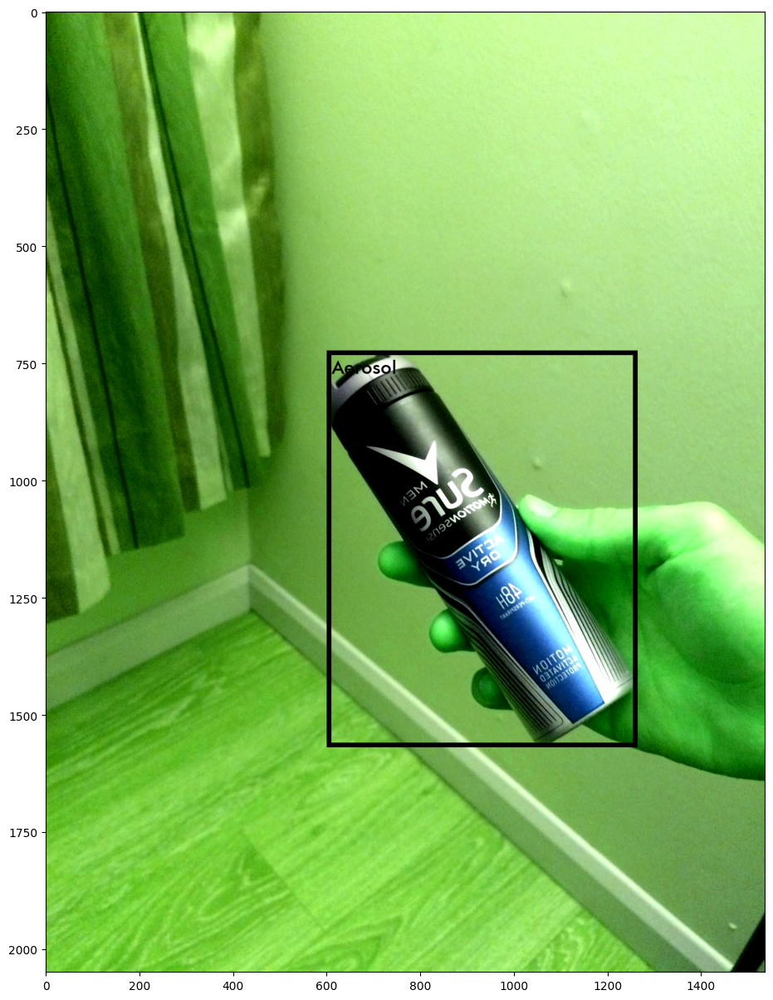

In [ ]:
# Lets view a sample of the new dataset

plt.figure(figsize=(15, 15))
sample = augmented_train_dataset[18]
img_int = torch.tensor(sample[0] * 255, dtype=torch.uint8) # convert from image of tensor between 0 to 1 back to 0 to 255
img_height = img_int.shape[1]
plt.imshow(draw_bounding_boxes(
    img_int, sample[1]['boxes'], [(classes[i]) for i in sample[1]['labels']], width=10, font="16020_FUTURAM.ttf", font_size=int(0.02 * img_height)
).permute(1, 2, 0))

In [ ]:
# Create new training dataloaders
augmented_train_dataloader = DataLoader(augmented_train_dataset, batch_size=4, shuffle=True, num_workers=0, collate_fn=collate_fn)

In [ ]:
len(augmented_train_dataloader)

263

## Now its time to create a new model instance and start training again

In [ ]:
# Create new model
model_weights = models.detection.FasterRCNN_ResNet50_FPN_V2_Weights.DEFAULT
model_2 = models.detection.fasterrcnn_resnet50_fpn_v2(weights=model_weights)

# Change the FastRCNNPredictor to suit our problem
num_classes = 61 # 60 classes + 1 for background
in_features = 1024
model_2.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

In [ ]:
model_2.to(device)
torch.compile(model_2)

OptimizedModule(
  (_orig_mod): FasterRCNN(
    (transform): GeneralizedRCNNTransform(
        Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        Resize(min_size=(800,), max_size=1333, mode='bilinear')
    )
    (backbone): BackboneWithFPN(
      (body): IntermediateLayerGetter(
        (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
        (layer1): Sequential(
          (0): Bottleneck(
            (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (bn2): BatchNorm2d(64, eps=1e-

In [ ]:
optimizer_2 = torch.optim.SGD(params = model_2.parameters(), lr=0.01, momentum=0.9, nesterov=True, weight_decay=1e-4)

In [ ]:
from tqdm.auto import tqdm
## Train the model
torch.manual_seed(42)
torch.cuda.manual_seed(42)

# Number of epochs:
epochs = 10

results_2 = {
    "train_loss": [],
    "valid_loss": []
}

# Training and evaluation loop
for epoch in range(epochs):
  model_2.train()
  total_loss = 0

  for images, targets in tqdm(augmented_train_dataloader):
    images_list = list(image.to(device) for image in images)
    targets_list = [{k:v.to(device) for k,v in t.items()} for t in targets]
    loss_dict = model_2(images_list, targets_list)
    loss = sum(value for value in loss_dict.values()) # add up all the different loses (We seek to minimise this)
    total_loss += loss
    optimizer_2.zero_grad()
    loss.backward()
    optimizer_2.step()

  # Calculate average training loss per batch
  average_loss = round(total_loss.item() / 263, 4)
  results_2["train_loss"].append(average_loss)
  print(f"[INFO] Epochs: {epoch}, Average training loss per batch: {average_loss}")

  valid_total_loss = 0
  with torch.inference_mode():
    for images, targets in tqdm(valid_dataloader):
      images_list = list(image.to(device) for image in images)
      targets_list = [{k:v.to(device) for k,v in t.items()} for t in targets]
      valid_loss_dict = model_2(images_list, targets_list)
      valid_loss = sum(value for value in valid_loss_dict.values()) # add up all the different loses
      valid_total_loss += valid_loss

  # Calculate average validation loss per batch
  valid_average_loss = round(valid_total_loss.item() / 75, 4)
  results_2["valid_loss"].append(valid_average_loss)
  print(f"[INFO] Epochs: {epoch}, Average validation loss per batch: {valid_average_loss}")

  # Saving model after every epoch
  MODEL_NAME = f"fasterrcnn_resnet50_{epoch+1}_epochs_augmented.pth"
  MODEL_SAVE_PATH = MODEL_PATH / MODEL_NAME
  torch.save(obj=model_2.state_dict(),
            f=MODEL_SAVE_PATH)
  print(f"Model saved to {MODEL_SAVE_PATH}")

  # Early stopping
  if epoch >=1 and (results_2["valid_loss"][epoch] > min(results_2["valid_loss"]) + 0.05):
    print("Early stopping")
    break

  0%|          | 0/263 [00:00<?, ?it/s]

[INFO] Epochs: 0, Average training loss per batch: 0.6896


  0%|          | 0/75 [00:00<?, ?it/s]

[INFO] Epochs: 0, Average validation loss per batch: 0.6728
Model saved to models/fasterrcnn_resnet50_1_epochs_augmented.pth


  0%|          | 0/263 [00:00<?, ?it/s]

[INFO] Epochs: 1, Average training loss per batch: 0.5463


  0%|          | 0/75 [00:00<?, ?it/s]

[INFO] Epochs: 1, Average validation loss per batch: 0.6118
Model saved to models/fasterrcnn_resnet50_2_epochs_augmented.pth


  0%|          | 0/263 [00:00<?, ?it/s]

[INFO] Epochs: 2, Average training loss per batch: 0.4817


  0%|          | 0/75 [00:00<?, ?it/s]

[INFO] Epochs: 2, Average validation loss per batch: 0.5753
Model saved to models/fasterrcnn_resnet50_3_epochs_augmented.pth


  0%|          | 0/263 [00:00<?, ?it/s]

[INFO] Epochs: 3, Average training loss per batch: 0.4303


  0%|          | 0/75 [00:00<?, ?it/s]

[INFO] Epochs: 3, Average validation loss per batch: 0.5872
Model saved to models/fasterrcnn_resnet50_4_epochs_augmented.pth


  0%|          | 0/263 [00:00<?, ?it/s]

[INFO] Epochs: 4, Average training loss per batch: 0.3839


  0%|          | 0/75 [00:00<?, ?it/s]

[INFO] Epochs: 4, Average validation loss per batch: 0.5955
Model saved to models/fasterrcnn_resnet50_5_epochs_augmented.pth


  0%|          | 0/263 [00:00<?, ?it/s]

[INFO] Epochs: 5, Average training loss per batch: 0.3559


  0%|          | 0/75 [00:00<?, ?it/s]

[INFO] Epochs: 5, Average validation loss per batch: 0.5783
Model saved to models/fasterrcnn_resnet50_6_epochs_augmented.pth


  0%|          | 0/263 [00:00<?, ?it/s]

[INFO] Epochs: 6, Average training loss per batch: 0.3195


  0%|          | 0/75 [00:00<?, ?it/s]

[INFO] Epochs: 6, Average validation loss per batch: 0.6321
Model saved to models/fasterrcnn_resnet50_7_epochs_augmented.pth
Early stopping


In [ ]:
results_2

{'train_loss': [0.6896, 0.5463, 0.4817, 0.4303, 0.3839, 0.3559, 0.3195],
 'valid_loss': [0.6728, 0.6118, 0.5753, 0.5872, 0.5955, 0.5783, 0.6321]}

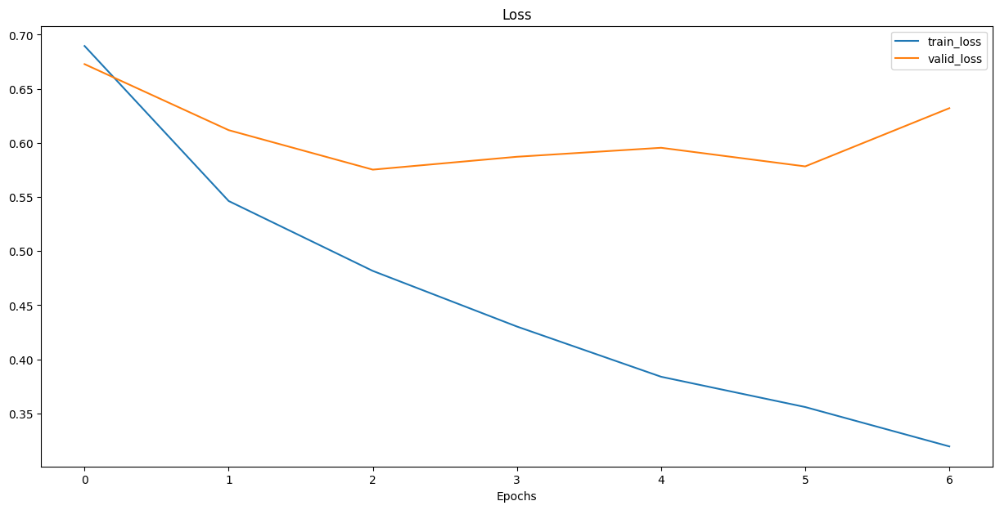

In [ ]:
# Plot the new loss curves
train_loss = results_2["train_loss"]
valid_loss = results_2["valid_loss"]

epochs = len(train_loss)

# Set up plot
plt.figure(figsize=(15, 7))
plt.plot(range(epochs), train_loss, label='train_loss')
plt.plot(range(epochs), valid_loss, label='valid_loss')
plt.title('Loss')
plt.xlabel('Epochs')
plt.legend();

### The lowest validation loss is at epoch 2 (model trained for 3 epochs). There is still some overfitting despite the data augmentations, perhaps a larger dataset with more pictures imitating an unclean environment (rather than pictures taken in the house) would help to decrease the validation loss further.

## We have to choose between the first model (unaugmented data) trained for 5 epochs and the second model (augmented data) trained for 3 epochs. The validation loss for the first model is lower but let's choose the better performing model by using the MAP (mean average precision) metric on the testing dataset.

In [ ]:
!pip install torchmetrics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 840.2/840.2 kB 17.6 MB/s eta 0:00:00


In [ ]:
import torchmetrics

In [ ]:
# Creating testing dataloaders
test_dataloader = DataLoader(test_dataset, batch_size=4, shuffle=False, num_workers=0, collate_fn=collate_fn)

In [ ]:
len(test_dataloader)

38

In [ ]:
# Loading the first model
model_weights = models.detection.FasterRCNN_ResNet50_FPN_V2_Weights.DEFAULT
model_V1 = models.detection.fasterrcnn_resnet50_fpn_v2(weights=model_weights)
num_classes = 61
in_features = 1024
model_V1.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
model_V1.load_state_dict(torch.load(f="models/fasterrcnn_resnet50_5_epochs_unaugmented.pth"))
model_V1.to(device)

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
       

In [ ]:
  # Testing model (the first model which was trained on unaugmented datasets)
  model_V1.eval()
  total_map = 0
  with torch.inference_mode():
    for images, targets in tqdm(test_dataloader):
      images_list = list(image.to(device) for image in images)
      targets_list = [{k:v.to(device) for k,v in t.items()} for t in targets]
      output_dict_list = model_V1(images_list)
      metric = torchmetrics.detection.MeanAveragePrecision(box_format='xyxy', iou_type='bbox')
      metric.update(output_dict_list, targets_list)
      map_dict = metric.compute()
      map = map_dict["map"] # get the global mean average precision
      total_map += map

  # Calculate average map per batch
  average_map = round(total_map.item() / 38, 4)
  print(f"[INFO] Average MAP per batch: {average_map}")

  0%|          | 0/38 [00:00<?, ?it/s]

[INFO] Average MAP per batch: 0.261


In [ ]:
# Loading the second model
model_V2 = models.detection.fasterrcnn_resnet50_fpn_v2(weights=model_weights)
model_V2.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
model_V2.load_state_dict(torch.load(f="models/fasterrcnn_resnet50_3_epochs_augmented.pth"))
model_V2.to(device)

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
       

In [ ]:
 # Testing model (the second model which was trained on augmented datasets)
model_V2.eval()
total_map = 0
with torch.inference_mode():
  for images, targets in tqdm(test_dataloader):
    images_list = list(image.to(device) for image in images)
    targets_list = [{k:v.to(device) for k,v in t.items()} for t in targets]
    output_dict_list = model_V2(images_list)
    metric = torchmetrics.detection.MeanAveragePrecision(box_format='xyxy', iou_type='bbox')
    metric.update(output_dict_list, targets_list)
    map_dict = metric.compute()
    map = map_dict["map"] # get the global map
    total_map += map

# Calculate average map per batch
average_map = round(total_map.item() / 38, 4)
print(f"[INFO] Average MAP per batch: {average_map}")

  0%|          | 0/38 [00:00<?, ?it/s]

[INFO] Average MAP per batch: 0.2058


Testing with the model_V2 6 epochs version (that had only slightly lower MAP score than the 3 epochs) also yielded results below that of modelV1 5 epochs. Hence, the best model will be model_V1 (trained on unaugmented data for 5 epochs)

In [ ]:
# Download the best model
from google.colab import files
files.download("models/fasterrcnn_resnet50_5_epochs_unaugmented.pth")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Let's see some simple predictions with the best performing model

In [ ]:
img, _ = test_dataset[33]
img_int = torch.tensor(img*255, dtype=torch.uint8)

model_V1.eval()
with torch.inference_mode():
    prediction = model_V1([img.to(device)])
    pred = prediction[0]

<ipython-input-107-8f8a899dbe43>:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_int = torch.tensor(img*255, dtype=torch.uint8)


In [ ]:
pred

{'boxes': tensor([[ 724.1210, 3226.8994, 2029.0859, 4080.9585],
         [ 619.0285,  378.9921, 2060.9648, 1181.3779],
         [ 680.4992, 3217.4556, 2177.3184, 4069.8562],
         [ 606.3717,  396.2346, 2078.6045, 1142.9772],
         [ 731.5092, 3218.8079, 2154.7166, 4029.5327],
         [ 868.1347, 3238.0784, 2046.3704, 4160.0000],
         [ 687.1973,  389.4642, 1985.2233, 1126.6726],
         [ 657.5717,  334.2735, 2021.6621, 1238.5485],
         [ 461.1917, 3774.7004,  856.1550, 4135.0513],
         [ 748.2986,  406.2481, 2005.2090, 1193.4302]], device='cuda:0'),
 'labels': tensor([12, 12, 20, 50, 21, 10, 27, 20, 36, 10], device='cuda:0'),
 'scores': tensor([0.8471, 0.7288, 0.1592, 0.1399, 0.0947, 0.0786, 0.0676, 0.0640, 0.0592,
         0.0534], device='cuda:0')}

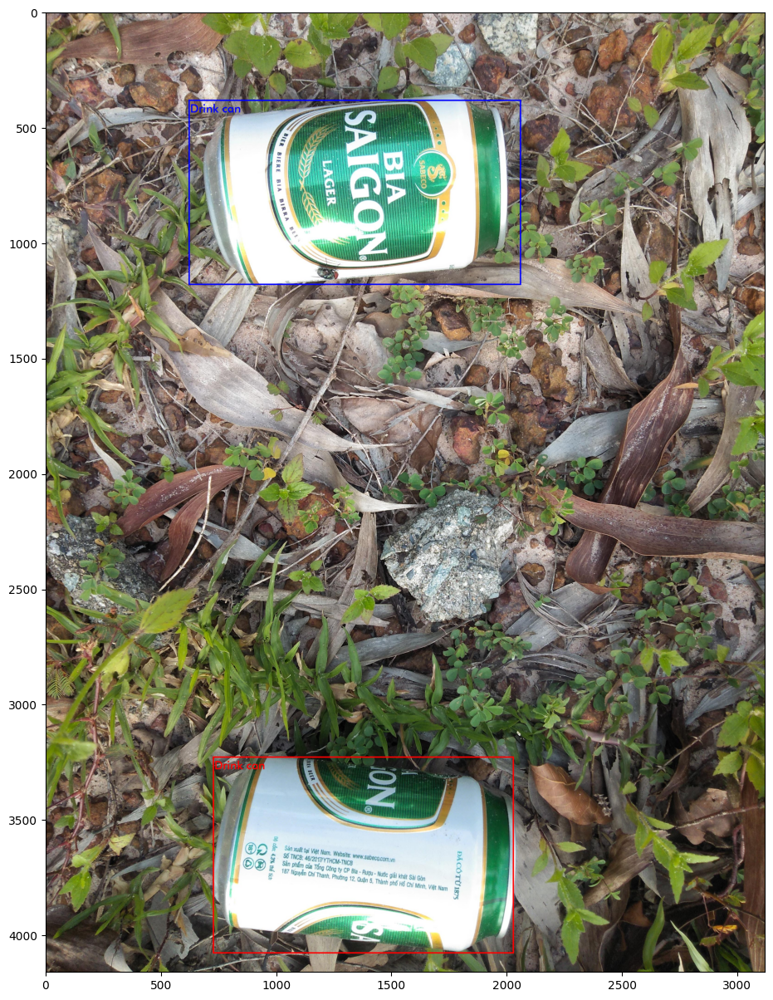

In [ ]:
plt.figure(figsize=(15,15))
plt.imshow(draw_bounding_boxes(img_int.to("cpu"),
    pred['boxes'][pred['scores'] > 0.7],
    [classes[i] for i in pred['labels'][pred['scores'] > 0.7].tolist()], width=6, font="16020_FUTURAM.ttf", font_size=50, colors=["red", "blue", "green"]
).permute(1, 2, 0))

## In the next notebook we will be deploying our model on Hugging Face spaces via a Gradio demo